In [ ]:
!pip install mediapipe

In [ ]:
import cv2
import numpy as np
import mediapipe as mp

# Initialize MediaPipe Face Mesh
mp_face_mesh = mp.solutions.face_mesh
face_mesh = mp_face_mesh.FaceMesh(static_image_mode=True)

# List of cropped face images (forehead to nose)
cropped_image_paths = [
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/Dark Circle 10.png',
   '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/Dark Circle 11.png',
   '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/Dark Circle 12(Wrong Prediction).png',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/Dark Circle 13.png',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/No Dark Circle 6.png',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/No Dark Circle 7.png',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/No Dark Circle 8.png',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/RLI_1.jpeg',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/RLI_2.jpeg',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/RLI_3.jpeg',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/RLI_4.jpeg',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/RLI_5.jpeg',
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/RLI_6.jpeg'
    '/content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/WhatsApp Image 2024-10-17 at 5.12.42 PM.jpeg'
]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Function to get the facial landmarks for a cropped image
def get_face_landmarks(image):
    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    result = face_mesh.process(rgb_image)
    if result.multi_face_landmarks:
        return result.multi_face_landmarks[0]
    return None

In [ ]:
# Function to convert landmark coordinates to pixel coordinates
def landmark_to_pixel(landmark, image_shape):
    h, w, _ = image_shape
    x_pixel = int(landmark.x * w)
    y_pixel = int(landmark.y * h)
    return (x_pixel, y_pixel)

In [ ]:
# Function to calculate region points from landmarks
def calculate_region_from_landmarks(landmarks, image_shape, landmark_indices):
    region_points = []
    for idx in landmark_indices:
        landmark = landmarks.landmark[idx]
        point = landmark_to_pixel(landmark, image_shape)
        region_points.append(point)
    return region_points

In [ ]:
# Function to draw the region on the image
def draw_region(image, region_points, color=(0, 255, 0), thickness=2):
    # Draw the polygon around the region points
    points = np.array(region_points, dtype=np.int32)
    cv2.polylines(image, [points], isClosed=True, color=color, thickness=thickness)

    # Optionally, you can also draw circles at each landmark point
    for point in region_points:
        cv2.circle(image, point, 3, (0, 0, 255), thickness=-1)  # Red color for the points



In [ ]:
# Function to calculate the average lightness from the Lab image
def get_average_lightness(lab_image, region_points):
    # Create a mask for the region
    mask = np.zeros(lab_image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [np.array(region_points, dtype=np.int32)], 255)

    # Extract the L (lightness) channel from the Lab image
    L_channel = lab_image[:, :, 0]

    # Apply the mask to extract the region's lightness values
    masked_L = cv2.bitwise_and(L_channel, L_channel, mask=mask)

    # Calculate the average lightness
    mean_lightness = cv2.mean(L_channel, mask=mask)[0]

    return mean_lightness



In [ ]:
# Function to calculate the average lightness from the Lab image
def get_average_lightness(lab_image, region_points):
    # Create a mask for the region
    mask = np.zeros(lab_image.shape[:2], dtype=np.uint8)
    cv2.fillPoly(mask, [np.array(region_points, dtype=np.int32)], 255)

    # Extract the L (lightness) channel from the Lab image
    L_channel = lab_image[:, :, 0]

    # Apply the mask to extract the region's lightness values
    masked_L = cv2.bitwise_and(L_channel, L_channel, mask=mask)

    # Calculate the average lightness
    mean_lightness = cv2.mean(L_channel, mask=mask)[0]

    return mean_lightness



In [ ]:
# forehead_points = [109, 10, 338, 337, 9, 108, 109]
# forehead_region = calculate_region_from_landmarks(landmarks, image.shape, forehead_points)
# forehead_lightness = get_average_lightness(lab_image, forehead_region)
# Set thresholds based on skin tone by checking the average forehead lightness
def get_dynamic_threshold(forehead_lightness):
    # Assuming L values in OpenCV are scaled to 0-255
    if forehead_lightness > 187:  # Light skin
        return 55  # Higher threshold for light skin
    elif 100 <= forehead_lightness <= 187:  # Medium skin
        return 40  # Moderate threshold for medium skin
    else:  # Dark skin
        return 20  # Lower threshold for dark skin

# # Get the dynamic threshold based on the forehead lightness
# threshold = get_dynamic_threshold(forehead_lightness)
# print (f"Forehead Lightness:{forehead_lightness}")
# print(f"Dynamic Threshold: {threshold}")

In [ ]:
def categorize_dark_circles(undereye_lightness, threshold):
    # Categorize based on the lightness difference compared to the dynamic threshold
    if undereye_lightness < threshold * 0.7:
        return "Mild", 33  # Mild dark circles (0-33%)
    elif threshold * 0.7 <= undereye_lightness < threshold:
        return "Moderate", 66  # Moderate dark circles (34-66%)
    else:
        return "Severe", 100  # Severe dark circles (67-100%)


In [ ]:
from google.colab.patches import cv2_imshow
# Function to process a cropped image and detect dark circles
def process_cropped_image(image_path):
    image = cv2.imread(image_path)

    # Check if image is loaded correctly
    if image is None:
        print(f"Could not load the image: {image_path}. Please check the file path.")
        return

    # Get face landmarks for the cropped image
    landmarks = get_face_landmarks(image)

    if landmarks is None:
        print(f"No face detected in cropped image: {image_path}")
        return

    # Convert the image to Lab color space for lightness analysis
    lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)

    # Define landmark points for undereye and forehead regions
    right_undereye_points = [244, 233,232, 231, 230, 229, 228, 31, 226, 130, 25, 110, 24, 23, 22, 26, 112, 244]  # Around the right eye
    left_undereye_points = [463, 341, 256, 252, 253, 254, 339, 255, 359, 446, 261, 448, 449, 450, 451, 452, 453, 464, 463]  # Around the left eye
    forehead_points = [109, 10, 338, 337, 9, 108, 109]  # Around the forehead

    # Calculate regions dynamically
    right_undereye_region = calculate_region_from_landmarks(landmarks, image.shape, right_undereye_points)
    left_undereye_region = calculate_region_from_landmarks(landmarks, image.shape, left_undereye_points)
    forehead_region = calculate_region_from_landmarks(landmarks, image.shape, forehead_points)

    # Draw regions on the image
    draw_region(image, right_undereye_region)
    draw_region(image, left_undereye_region)
    draw_region(image, forehead_region)

    # Calculate the average lightness for each region
    right_undereye_lightness = get_average_lightness(lab_image, right_undereye_region)
    left_undereye_lightness = get_average_lightness(lab_image, left_undereye_region)
    forehead_lightness = get_average_lightness(lab_image, forehead_region)


    # Calculate the difference between forehead and under-eye lightness
    right_diff = forehead_lightness - right_undereye_lightness
    left_diff = forehead_lightness - left_undereye_lightness
    threshold = get_dynamic_threshold(forehead_lightness)

     # Calculate the percentage of dark circles if it exceeds the threshold
    right_dark_circle_category, right_dark_circle_percentage = categorize_dark_circles(right_diff, threshold)
    left_dark_circle_category, left_dark_circle_percentage = categorize_dark_circles(left_diff, threshold)

 # Output the results
    print(f"Forehead Lightness: {forehead_lightness}")
    print(f"Dynamic Threshold: {threshold}")
    print(f"Right undereye lightness : {right_diff}")
    print(f"Left undereye lightness : {left_diff}")
    print(f"Right Dark Circle Category: {right_dark_circle_category}, Right Dark Circle Percentage: {right_dark_circle_percentage}%")
    print(f"Left Dark Circle Category: {left_dark_circle_category}, Left Dark Circle Percentage: {left_dark_circle_percentage}%")
    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

Forehead Lightness: 194.7511607563421
Dynamic Threshold: 55
Right undereye lightness : 36.78677488982498
Left undereye lightness : 53.911853707357636
Right Dark Circle Category: Mild, Right Dark Circle Percentage: 33%
Left Dark Circle Category: Moderate, Left Dark Circle Percentage: 66%


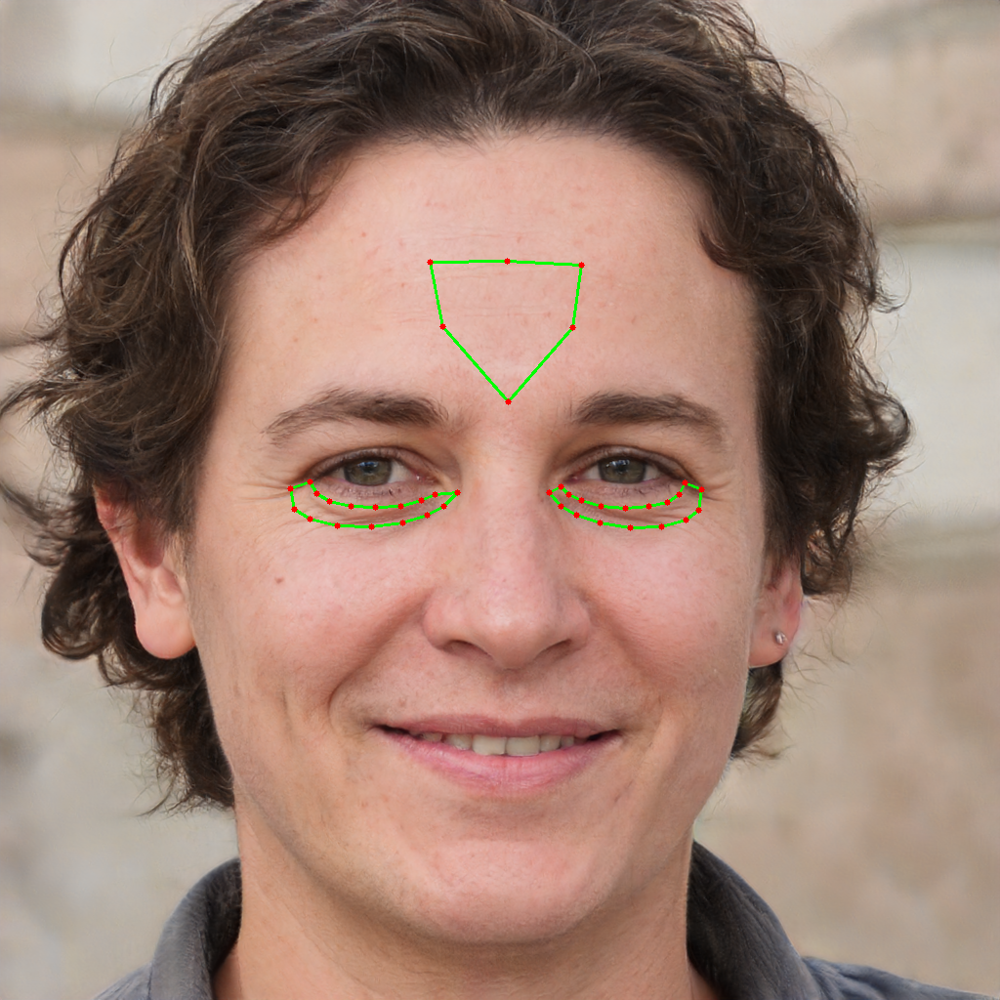

Forehead Lightness: 169.1201537759823
Dynamic Threshold: 40
Right undereye lightness : 49.34735719165781
Left undereye lightness : 69.81361875012428
Right Dark Circle Category: Severe, Right Dark Circle Percentage: 100%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


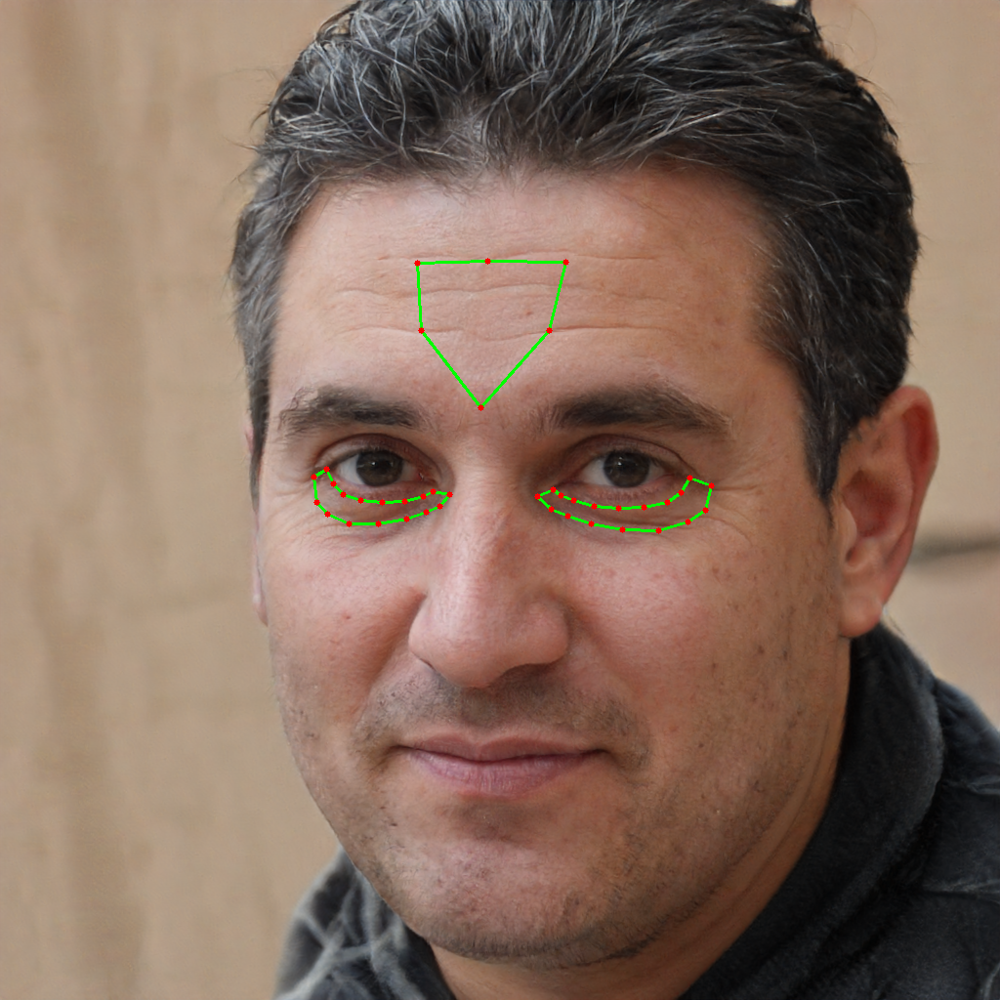

Could not load the image: /content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/Dark Circle 12(Wrong Prediction).png. Please check the file path.
Forehead Lightness: 157.51788202508126
Dynamic Threshold: 40
Right undereye lightness : 36.46640307172518
Left undereye lightness : 72.76011139271256
Right Dark Circle Category: Moderate, Right Dark Circle Percentage: 66%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


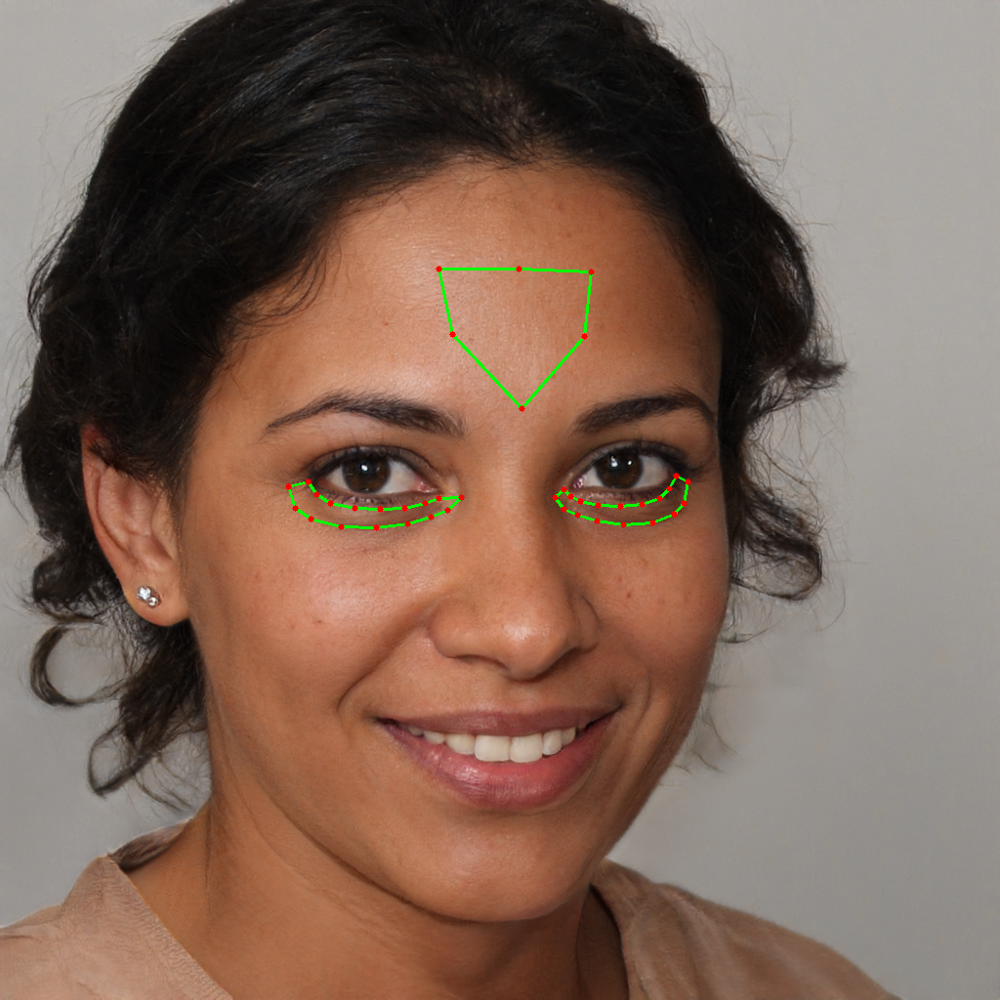

Forehead Lightness: 195.19246488816228
Dynamic Threshold: 55
Right undereye lightness : 32.57961619839051
Left undereye lightness : 41.93708231115002
Right Dark Circle Category: Mild, Right Dark Circle Percentage: 33%
Left Dark Circle Category: Moderate, Left Dark Circle Percentage: 66%


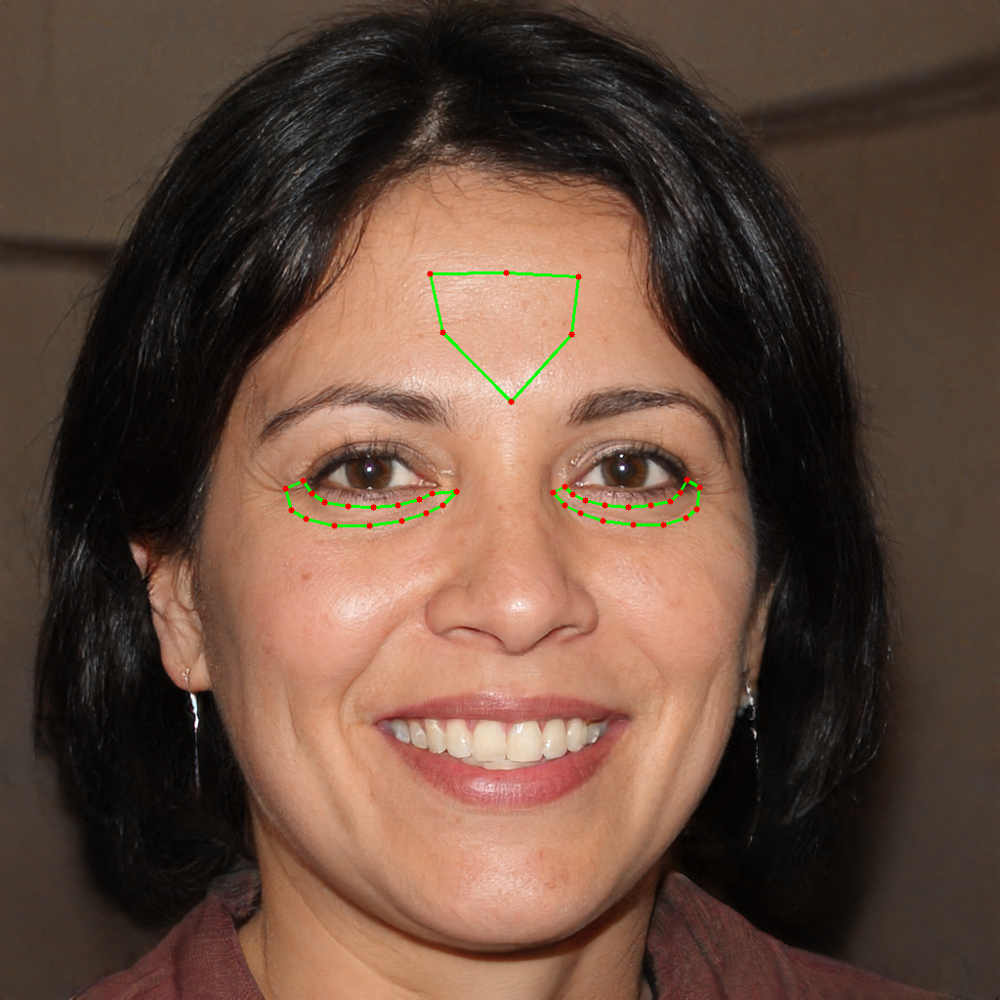

Could not load the image: /content/drive/MyDrive/TechSharthi_Skin_Disease_Detection /Dark_Circle_Detection/No Dark Circle 7.png. Please check the file path.
Forehead Lightness: 201.09489198465576
Dynamic Threshold: 55
Right undereye lightness : 43.92010843487222
Left undereye lightness : 39.59117344918664
Right Dark Circle Category: Moderate, Right Dark Circle Percentage: 66%
Left Dark Circle Category: Moderate, Left Dark Circle Percentage: 66%


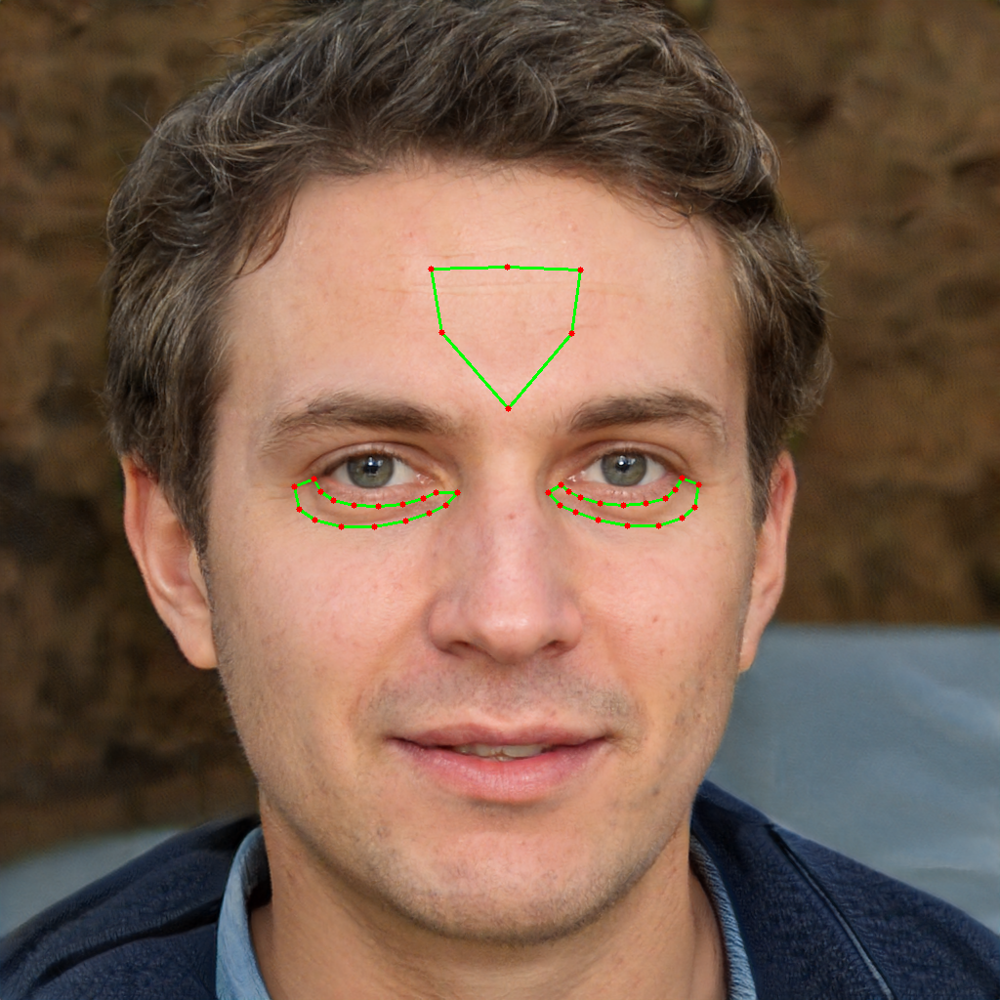

Forehead Lightness: 173.20548357939137
Dynamic Threshold: 40
Right undereye lightness : 69.74585625019883
Left undereye lightness : 88.64485089046343
Right Dark Circle Category: Severe, Right Dark Circle Percentage: 100%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


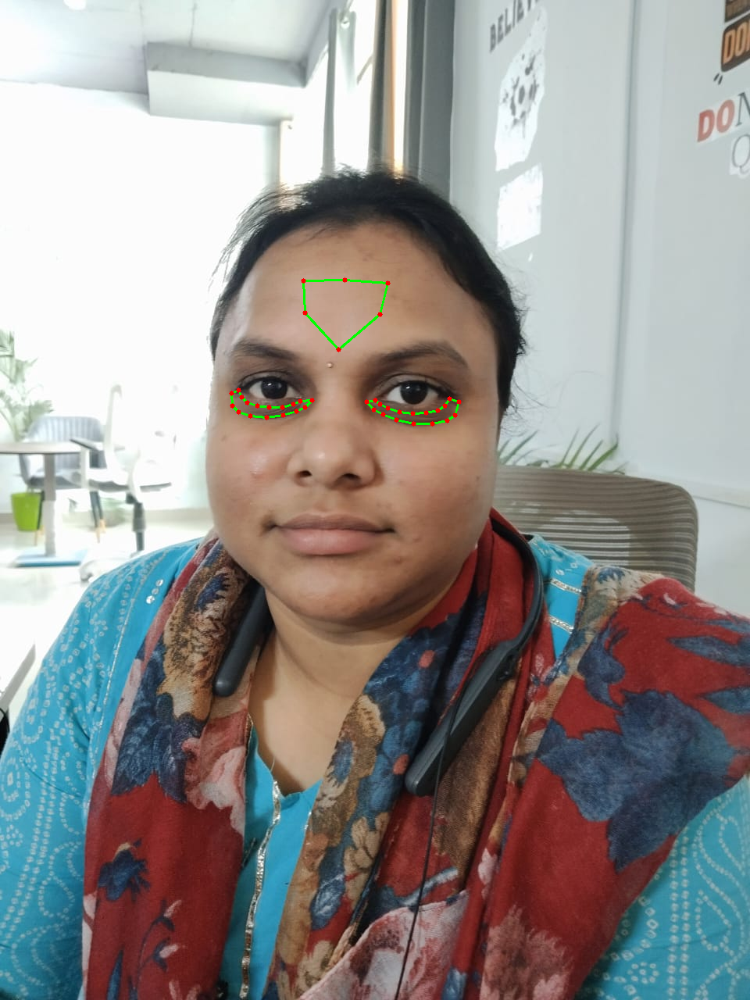

Forehead Lightness: 184.27522935779817
Dynamic Threshold: 40
Right undereye lightness : 50.700891272258474
Left undereye lightness : 62.215823417204106
Right Dark Circle Category: Severe, Right Dark Circle Percentage: 100%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


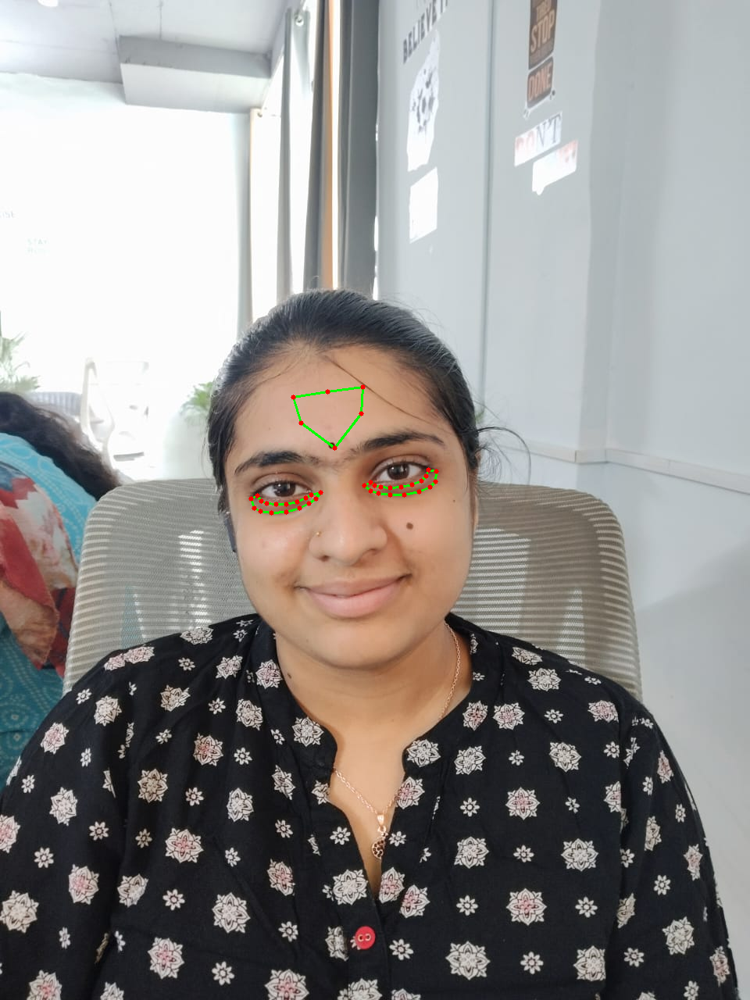

Forehead Lightness: 163.79559170821307
Dynamic Threshold: 40
Right undereye lightness : 57.7000981459813
Left undereye lightness : 56.53495921093935
Right Dark Circle Category: Severe, Right Dark Circle Percentage: 100%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


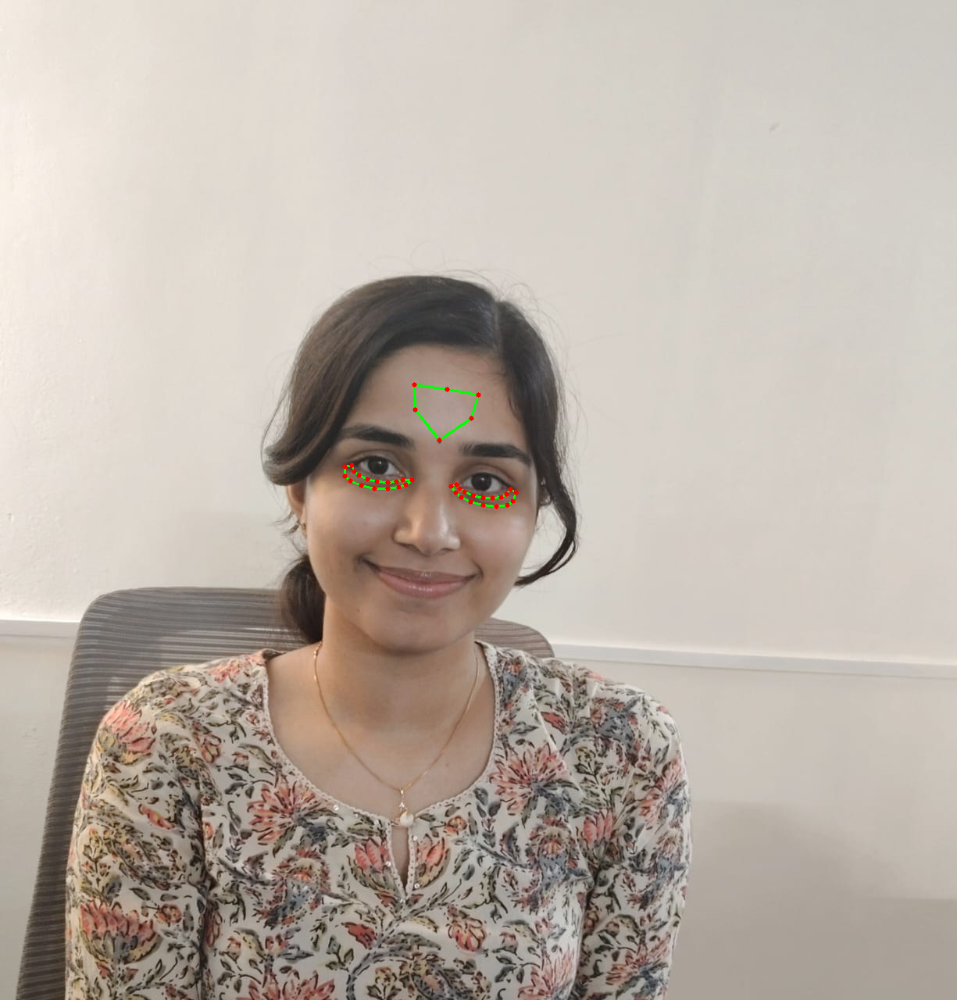

Forehead Lightness: 193.9809923130678
Dynamic Threshold: 55
Right undereye lightness : 52.33067123892886
Left undereye lightness : 61.669497375605005
Right Dark Circle Category: Moderate, Right Dark Circle Percentage: 66%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


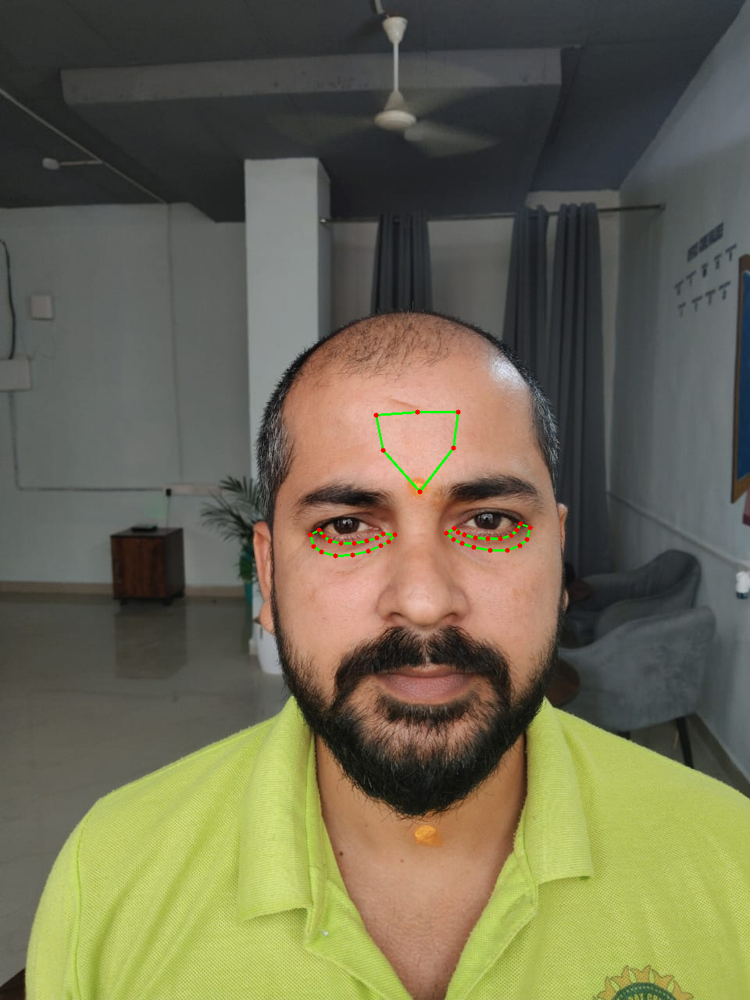

Forehead Lightness: 213.81643002028397
Dynamic Threshold: 55
Right undereye lightness : 61.215154103218566
Left undereye lightness : 63.70818771641109
Right Dark Circle Category: Severe, Right Dark Circle Percentage: 100%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


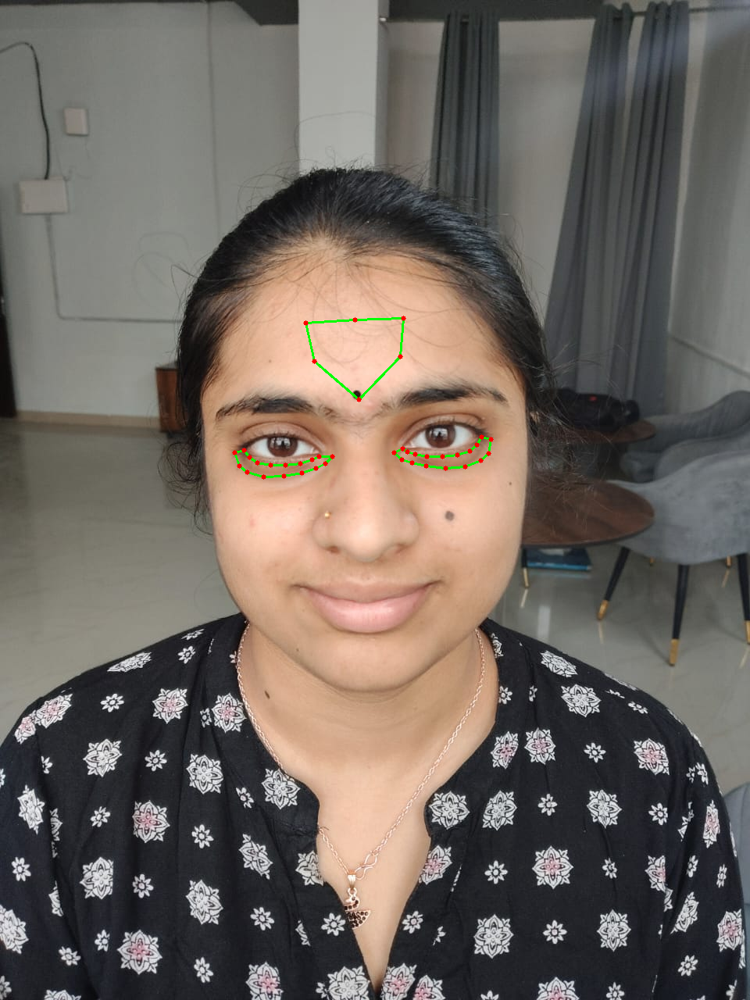

Forehead Lightness: 202.86002856559887
Dynamic Threshold: 55
Right undereye lightness : 59.41777252262662
Left undereye lightness : 67.35181767536551
Right Dark Circle Category: Severe, Right Dark Circle Percentage: 100%
Left Dark Circle Category: Severe, Left Dark Circle Percentage: 100%


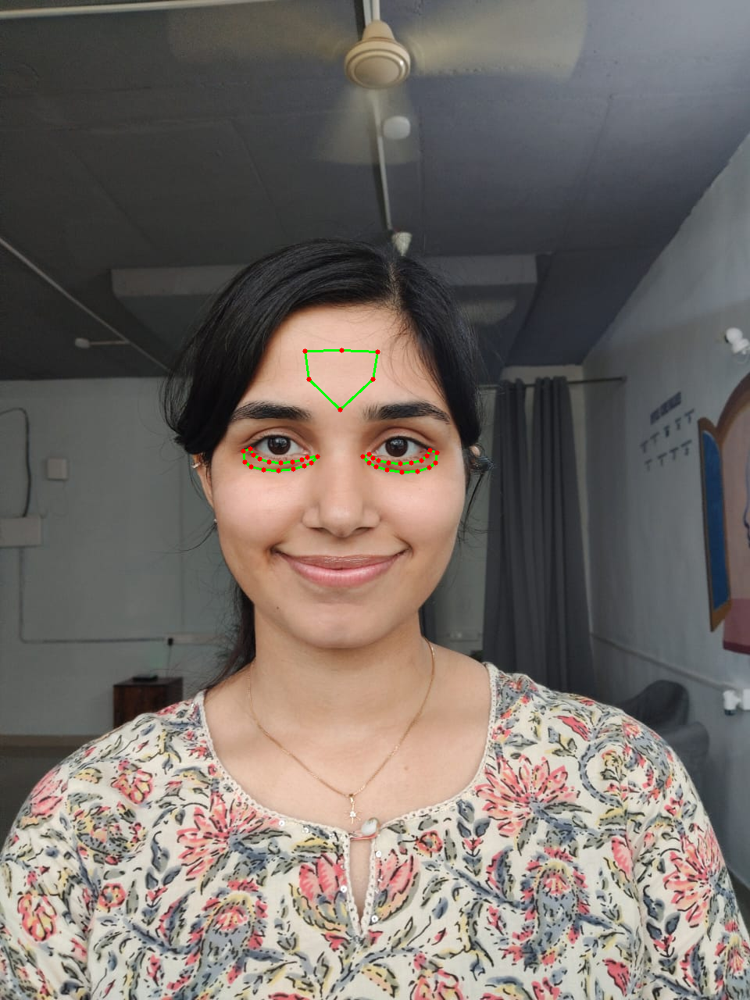

Forehead Lightness: 237.84100418410043
Dynamic Threshold: 55
Right undereye lightness : 71.1625171864645
Left undereye lightness : 22.99142536340247
Right Dark Circle Category: Severe, Right Dark Circle Percentage: 100%
Left Dark Circle Category: Mild, Left Dark Circle Percentage: 33%


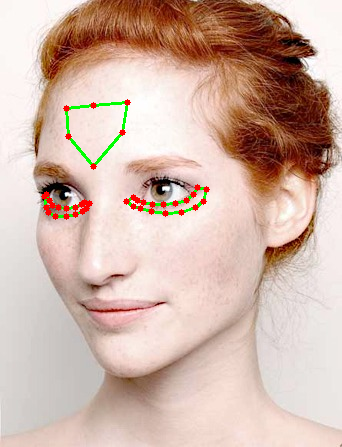

In [ ]:
# Process each cropped image
for image_path in cropped_image_paths:
    process_cropped_image(image_path)